##### This project will discuss and analyze COVID-19 data and gain a better understanding through data visualization. Through the creation of bar charts, line graphs, bubble charts and scatter plots the goal is to examine the impact of best practices and preventative measures in various sectors that makes outbreaks managable with available health resources.

##### My goal is to show the significant amount of American deaths (overseen by the Trump administration) compared to deaths in all other countries

##### In loving memory of all those who have lost thier lives and loving support to those who lost those close to them.

### Import Necessary Libraries

In [5]:
# Data analysis and manipulation
import plotly.graph_objects as go
import plotly.io as pio
import plotly.express as px
import pandas as pd

# Data Visualization
import matplotlib.pyplot as plt

# Importing Plotly
import plotly.offline as py
py.init_notebook_mode(connected=True)

# Initializing Plotly
pio.renderers.default = 'colab'

### Import Datasets

##### 3 datasets will be imported for this project

In [8]:
# Importing Dataset1
dataset1 = pd.read_csv("C:\\Users\\seven\\Downloads\\covid.csv")
dataset1.head() # Show first 5 rows

,Country/Region,Continent,Population,TotalCases,NewCases,TotalDeaths,NewDeaths,TotalRecovered,NewRecovered,ActiveCases,"Serious,Critical",Tot Cases/1M pop,Deaths/1M pop,TotalTests,Tests/1M pop,WHO Region,iso_alpha
0,USA,North America,3.311981e+08,5032179,NaN,162804.0,NaN,2576668.0,NaN,2292707.0,18296.0,15194.0,492.0,63139605.0,190640.0,Americas,USA
1,Brazil,South America,2.127107e+08,2917562,NaN,98644.0,NaN,2047660.0,NaN,771258.0,8318.0,13716.0,464.0,13206188.0,62085.0,Americas,BRA
2,India,Asia,1.381345e+09,2025409,NaN,41638.0,NaN,1377384.0,NaN,606387.0,8944.0,1466.0,30.0,22149351.0,16035.0,South-EastAsia,IND
3,Russia,Europe,1.459409e+08,871894,NaN,14606.0,NaN,676357.0,NaN,180931.0,2300.0,5974.0,100.0,29716907.0,203623.0,Europe,RUS
4,South Africa,Africa,5.938157e+07,538184,NaN,9604.0,NaN,387316.0,NaN,141264.0,539.0,9063.0,162.0,3149807.0,53044.0,Africa,ZAF


##### Getting dataset information

In [10]:
# Return tuple of shape (Rows, columns)
print(dataset1.shape)

# Returns size of the dataframe
print(dataset1.size)

(209, 17)
3553


In [11]:
# Information about Dataset1
# return concise summary of datagrame
dataset1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209 entries, 0 to 208
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Country/Region    209 non-null    object 
 1   Continent         208 non-null    object 
 2   Population        208 non-null    float64
 3   TotalCases        209 non-null    int64  
 4   NewCases          4 non-null      float64
 5   TotalDeaths       188 non-null    float64
 6   NewDeaths         3 non-null      float64
 7   TotalRecovered    205 non-null    float64
 8   NewRecovered      3 non-null      float64
 9   ActiveCases       205 non-null    float64
 10  Serious,Critical  122 non-null    float64
 11  Tot Cases/1M pop  208 non-null    float64
 12  Deaths/1M pop     187 non-null    float64
 13  TotalTests        191 non-null    float64
 14  Tests/1M pop      191 non-null    float64
 15  WHO Region        184 non-null    object 
 16  iso_alpha         209 non-null    object 
dt

In [12]:
# Importing Dataset2
dataset2 = pd.read_csv("C:\\Users\\seven\\Downloads\\covid_grouped.csv")
dataset2.head() # Show first 5 rows

,Date,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,WHO Region,iso_alpha
0,2020-01-22,Afghanistan,0,0,0,0,0,0,0,Eastern Mediterranean,AFG
1,2020-01-22,Albania,0,0,0,0,0,0,0,Europe,ALB
2,2020-01-22,Algeria,0,0,0,0,0,0,0,Africa,DZA
3,2020-01-22,Andorra,0,0,0,0,0,0,0,Europe,AND
4,2020-01-22,Angola,0,0,0,0,0,0,0,Africa,AGO


In [13]:
# Return tuple of shape (Rows, columns)
print(dataset2.shape)

# Returns size of the dataframe
print(dataset2.size)

(35156, 11)
386716


In [14]:
# Information about Dataset1
# return concise summary of datagrame
dataset2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35156 entries, 0 to 35155
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Date            35156 non-null  object
 1   Country/Region  35156 non-null  object
 2   Confirmed       35156 non-null  int64 
 3   Deaths          35156 non-null  int64 
 4   Recovered       35156 non-null  int64 
 5   Active          35156 non-null  int64 
 6   New cases       35156 non-null  int64 
 7   New deaths      35156 non-null  int64 
 8   New recovered   35156 non-null  int64 
 9   WHO Region      35156 non-null  object
 10  iso_alpha       35156 non-null  object
dtypes: int64(7), object(4)
memory usage: 3.0+ MB


### Dataset Cleaning

In [16]:
# Columns labels (headers) of Dataset1
dataset1.columns

Index(['Country/Region', 'Continent', 'Population', 'TotalCases', 'NewCases',
       'TotalDeaths', 'NewDeaths', 'TotalRecovered', 'NewRecovered',
       'ActiveCases', 'Serious,Critical', 'Tot Cases/1M pop', 'Deaths/1M pop',
       'TotalTests', 'Tests/1M pop', 'WHO Region', 'iso_alpha'],
      dtype='object')

##### We do not need 'NewCases', 'NewDeaths', 'NewRecovered' columns because they contain NaN (null) values.

In [18]:
# Drop NewCases, NewDeaths, NewRecovered rows from dataset1
dataset1.drop(['NewCases', 'NewDeaths', 'NewRecovered'],
              axis=1, inplace=True)
# Select random set of values from dataset1
dataset1.sample(5)

,Country/Region,Continent,Population,TotalCases,TotalDeaths,TotalRecovered,ActiveCases,"Serious,Critical",Tot Cases/1M pop,Deaths/1M pop,TotalTests,Tests/1M pop,WHO Region,iso_alpha
184,Seychelles,Africa,98408.0,126,NaN,124.0,2.0,NaN,1280.0,NaN,NaN,NaN,Africa,SYC
117,Namibia,Africa,2545264.0,2652,15.0,563.0,2074.0,24.0,1042.0,6.0,29233.0,11485.0,Africa,NAM
34,Panama,North America,4321282.0,71418,1574.0,45658.0,24186.0,161.0,16527.0,364.0,240995.0,55769.0,Americas,PAN
198,Grenada,North America,112576.0,24,NaN,23.0,1.0,NaN,213.0,NaN,6252.0,55536.0,Americas,GRD
33,Dominican Republic,North America,10858648.0,76536,1246.0,40539.0,34751.0,317.0,7048.0,115.0,281926.0,25963.0,Americas,DOM


##### Create table using plotly express

In [20]:
# Import create_table Figure Factory
from plotly.figure_factory import create_table

colorscale = [[0, '#4d004c'], [.5, '#f2e5ff'], [1, '#ffffff']]
table = create_table(dataset1.head(15), colorscale=colorscale)

table.update_layout(
    width=2000,
    height=800,
    margin=dict(l=20, r=20, t=20, b=20),
)
py.iplot(table)

### Show comparisons between COVID infected countries in terms of total cases, total deaths, total recovered and total tests

In [22]:
px.bar(dataset1.head(15), x = 'Country/Region',
       y = 'TotalCases', color = 'TotalCases',
       height = 500,hover_data = ['Country/Region', 'Continent'])

##### The plot clearly shows the data for the top 15 countries

In [24]:
px.bar(dataset1.head(15), x = 'Country/Region', y = 'TotalCases',
       color = 'TotalDeaths', height = 500,
       hover_data = ['Country/Region', 'Continent'])

##### Analyzing by color, we compare the total number of recovered cases

In [26]:
px.bar(dataset1.head(15), x = 'Country/Region', y = 'TotalCases',
       color = 'TotalTests', height = 500, hover_data = ['Country/Region', 'Continent'])

##### Creating a horizontal orientation plot with X axis as TotalTests and Y axis as Country/Region with passing parameter orientation by TotalTests

In [28]:
px.bar(dataset1.head(15), x = 'TotalTests', y = 'Country/Region',
       color = 'TotalTests', orientation = 'h', height = 500,
       hover_data = ['Country/Region', 'Continent'])

##### Checking TotalTests in relation to Continent

In [30]:
px.bar(dataset1.head(15), x = 'TotalTests', y = 'Continent',
       color = 'TotalTests', orientation = 'h', height = 500,
       hover_data = ['Country/Region', 'Continent'])

##### Theory1: Due to fewer testing metrics in non-USA countries and/or non-North American continents, the possibility for limited access to testing and treatment facilities might be a factor. That said, the number of USA and North American cases and deaths is significantly higher than all other countries/continents

### Looking further into the data with utilization of Bubble and Scatter plots

In [33]:
px.scatter(dataset1, x = 'Continent', y = 'TotalCases',
           hover_data = ['Country/Region', 'Continent'],
           color = 'TotalCases', size = 'TotalCases', size_max = 80)

In [34]:
px.scatter(dataset1.head(57), x = 'Continent', y = 'TotalCases',
           hover_data = ['Country/Region', 'Continent'],
           color = 'TotalCases', size = 'TotalCases', size_max = 80, log_y = True)

In [35]:
px.scatter(dataset1.head(54), x = 'Continent', y = 'TotalTests',
           hover_data = ['Country/Region', 'Continent'],
           color = 'TotalTests', size = 'TotalTests', size_max = 80)

In [36]:
px.scatter(dataset1.head(54), x = 'Continent', y = 'TotalTests',
           hover_data = ['Country/Region', 'Continent'],
           color = 'TotalTests', size = 'TotalTests', size_max = 80, log_y=True)

### Analzing charts by Country in comparison to Continent

In [38]:
px.scatter(dataset1.head(100), x = 'Country/Region', y = 'TotalCases',
           hover_data = ['Country/Region', 'Continent'],
           color = 'TotalCases', size = 'TotalCases', size_max = 80)

In [39]:
px.scatter(dataset1.head(30), x = 'Country/Region', y = 'TotalCases',
           hover_data = ['Country/Region', 'Continent'],
           color = 'Country/Region', size = 'TotalCases', size_max = 80, log_y=True)

##### Now format the charts of the Country/Region in relation to the total number of deaths, and other aspects from Dataset1

In [41]:
px.scatter(dataset1.head(10), x = 'Country/Region', y = 'TotalDeaths',
           hover_data = ['Country/Region', 'Continent'],
           color = 'Country/Region', size = 'TotalDeaths', size_max = 80)

In [42]:
px.scatter(dataset1.head(30), x = 'Country/Region', y = 'Tests/1M pop',
           hover_data = ['Country/Region', 'Continent'],
           color = 'Country/Region', size = 'Tests/1M pop', size_max = 80)

In [43]:
px.scatter(dataset1.head(30), x = 'Country/Region', y = 'Tests/1M pop',
           hover_data = ['Country/Region', 'Continent'],
           color = 'Tests/1M pop', size = 'Tests/1M pop', size_max = 80)

In [44]:
px.scatter(dataset1.head(30), x = 'TotalCases', y = 'TotalDeaths',
           hover_data = ['Country/Region', 'Continent'],
           color = 'TotalDeaths', size = 'TotalDeaths', size_max = 80)

##### There is a linear relationship between total number of cases and total number of deaths. Therefore- more cases = more deaths

In [46]:
px.scatter(dataset1.head(30), x = 'TotalCases', y = 'TotalDeaths',
           hover_data = ['Country/Region', 'Continent'],
           color = 'TotalDeaths', size = 'TotalDeaths', size_max = 80, log_x=True, log_y=True)

In [47]:
px.scatter(dataset1.head(30), x = 'TotalTests', y = 'TotalCases',
           hover_data = ['Country/Region', 'Continent'],
           color = 'TotalTests', size = 'TotalTests', size_max = 80,
           log_x=True, log_y=True)

##### Theory1 Inconslusive. In order to have a standard rate of testing, each Country would need to have similar denominationalvalues

### Chronology of infection with use of bar graphs

In [50]:
px.bar(dataset2, x = "Date", y = "Confirmed", color = "Confirmed",
       hover_data = ["Confirmed", "Date", "Country/Region"], height=400)

##### Above Graph shows the output of all countries with respect to recoveries. The exponential growth of cases by date is speculative.

In [52]:
px.bar(dataset2, x="Date", y="Confirmed", color="Confirmed", 
       hover_data=["Confirmed", "Date", "Country/Region"],log_y=True, height=400)

##### Not helpful, but does give information all the same. Swapping out Confirmed with Deaths

In [54]:
px.bar(dataset2, x = "Date", y = "Deaths", color = "Deaths",
       hover_data = ["Confirmed", "Date", "Country/Region"],
       log_y=False, height = 400)

### Since USA is bar far the Country with the highes number of cases and deaths, we will specifically analyze USA

In [56]:
df_US = dataset2.loc[dataset2["Country/Region"] == "US"]

In [57]:
px.bar(df_US, x = "Date", y = "Confirmed", color = "Confirmed", height = 400)

In [58]:
px.bar(df_US, x = "Date", y = "Recovered", color = "Recovered", height = 400)

In [59]:
px.line(df_US, x = "Date", y = "Recovered", height = 400)

In [60]:
px.line(df_US, x = "Date", y = "Deaths", height = 400)

In [61]:
px.line(df_US, x = "Date", y = "Confirmed", height = 400)

In [62]:
px.line(df_US, x = "Date", y = "New cases", height = 400)

In [63]:
px.bar(df_US, x = "Date", y = "New cases", height = 400)

In [64]:
px.scatter(df_US, x = "Confirmed", y = "Deaths", height = 400)

### Visualizing data with use of maps

In [66]:
px.choropleth(dataset2,
              locations = "iso_alpha",
              color = "Confirmed",
              hover_name = "Country/Region",
              color_continuous_scale = "Blues",
              title = "Confirmed Cases by Date",
              animation_frame = "Date")

In [67]:
px.choropleth(dataset2,
              locations = "iso_alpha",
              color = "Deaths",
              hover_name = "Country/Region",
              color_continuous_scale = "Viridis",
              title = "Deaths by Date",
              animation_frame = "Date")

In [68]:
px.choropleth(dataset2,
              locations = "iso_alpha",
              color = "Recovered",
              hover_name = "Country/Region",
              color_continuous_scale = "RdYlGn",
              projection = "natural earth",
              title = "Recoveries by Date",
              animation_frame = "Date")

In [69]:
px.bar(dataset2, x = "WHO Region", y = "Confirmed", color = "WHO Region",
       animation_frame = "Date", hover_name = "Country/Region")

In [70]:
px.bar(dataset2, x = "WHO Region", y = "Deaths", color = "WHO Region",
       animation_frame = "Date", hover_name = "Country/Region")

### Visulaizing text using Word Cloud

In [72]:
dataset3 = pd.read_csv("C:\\Users\\seven\\Downloads\\coviddeath.csv")
dataset3.head()

,Data as of,Start Week,End Week,State,Condition Group,Condition,ICD10_codes,Age Group,Number of COVID-19 Deaths,Flag
0,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,0-24,122.0,NaN
1,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,25-34,596.0,NaN
2,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,35-44,1521.0,NaN
3,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,45-54,4186.0,NaN
4,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,55-64,10014.0,NaN


In [73]:
dataset3.tail()

,Data as of,Start Week,End Week,State,Condition Group,Condition,ICD10_codes,Age Group,Number of COVID-19 Deaths,Flag
12255,08/30/2020,02/01/2020,08/29/2020,YC,Coronavirus Disease 2019,COVID-19,U071,65-74,5024.0,NaN
12256,08/30/2020,02/01/2020,08/29/2020,YC,Coronavirus Disease 2019,COVID-19,U071,75-84,5381.0,NaN
12257,08/30/2020,02/01/2020,08/29/2020,YC,Coronavirus Disease 2019,COVID-19,U071,85+,4841.0,NaN
12258,08/30/2020,02/01/2020,08/29/2020,YC,Coronavirus Disease 2019,COVID-19,U071,Not stated,NaN,Counts less than 10 suppressed.
12259,08/30/2020,02/01/2020,08/29/2020,YC,Coronavirus Disease 2019,COVID-19,U071,All ages,20628.0,NaN


In [74]:
dataset3.groupby(["Condition"]).count()

,Data as of,Start Week,End Week,State,Condition Group,ICD10_codes,Age Group,Number of COVID-19 Deaths,Flag
Condition,,,,,,,,,
Adult respiratory distress syndrome,540,540,540,540,540,540,540,272,268
All other conditions and causes (residual),540,540,540,540,540,540,540,363,177
Alzheimer disease,530,530,530,530,530,530,530,144,386
COVID-19,540,540,540,540,540,540,540,377,163
Cardiac arrest,520,520,520,520,520,520,520,219,301
Cardiac arrhythmia,540,540,540,540,540,540,540,192,348
Cerebrovascular diseases,530,530,530,530,530,530,530,187,343
Chronic lower respiratory diseases,540,540,540,540,540,540,540,229,311
Diabetes,540,540,540,540,540,540,540,276,264


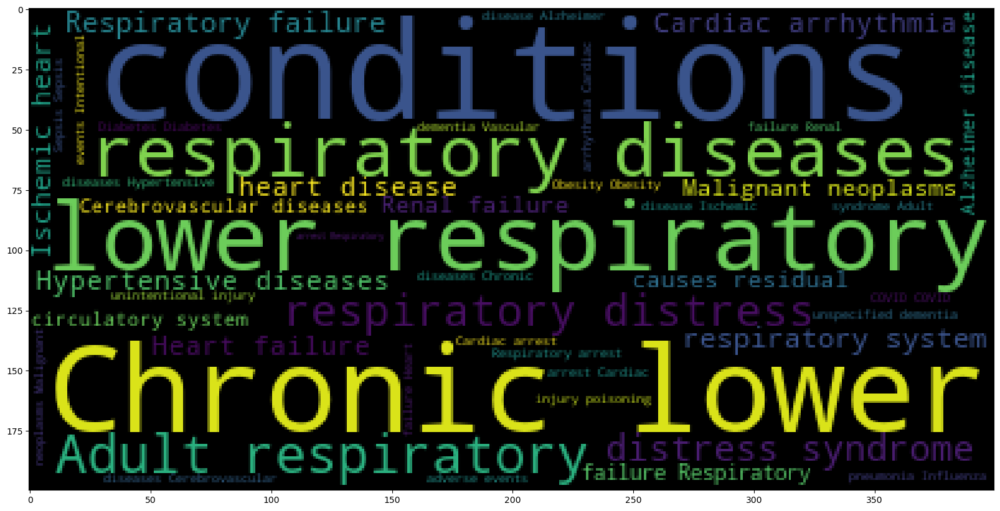

In [75]:
# import word cloud
from wordcloud import WordCloud

sentences = dataset3["Condition"].tolist()
sentences_as_a_string = ' '.join(sentences)

# Convert the string into WordCloud
plt.figure(figsize = (20, 20))
plt.imshow(WordCloud().generate(sentences_as_a_string))

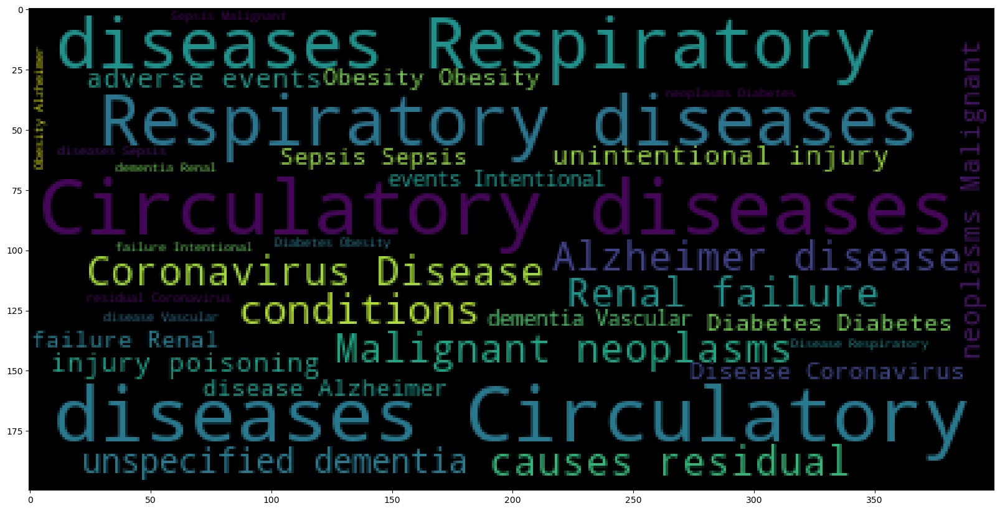

In [125]:
column2_tolist = dataset3["Condition Group"].tolist()

# Convert the list to one single string
column_to_string = " ".join(column2_tolist)

# Convert the string into WordCloud
plt.figure(figsize = (20, 20))
plt.imshow(WordCloud().generate(column_to_string))

##### Conclusion: WIth only 7 months worth of data, this report only shows the first part of the COVID/2020 era. After seeing the USA facing data, we can only speculate on the effect of 'ignorant rhetoric' had on the spike in USA deaths and confirmations. We are all familiar with ridiculous fervour of non mask wearing, anti-vaccine talking points, obsurd cure thoeries (bleach, UV light) and creating a political divide over a pandemic that killed thousands. 